In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s5e7/sample_submission.csv
/kaggle/input/playground-series-s5e7/train.csv
/kaggle/input/playground-series-s5e7/test.csv


# 🧠 Predicting Introverts vs Extroverts using XGBoost

## 📋 Overview
The goal of this competition is to predict whether a person is an Introvert or an Extrovert using behavioral and personality traits.

## 🚀 Why XGBoost?
From my past Kaggle experience, I have observed that Boosting algorithms like XGBoost 🥇 often deliver state-of-the-art (SOTA) results, especially for binary classification tasks.
This notebook focuses on using XGBoost, along with additional techniques to improve performance.

## 1. Importing Libraries 📚

Library	Purpose
* scikit-learn 🤖	Machine Learning algorithms, preprocessing, model evaluation
* xgboost ⚡	Gradient boosting library for fast and accurate classification
* imbalanced-learn 🔄	Handle imbalanced data using techniques like SMOTE
* lightgbm 🚀	Another fast and efficient gradient boosting library
* shap 🧐	Model interpretability & feature explanation

In [2]:
!pip install -U scikit-learn xgboost imbalanced-learn lightgbm shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 73.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 92.9 MB/s eta 0:00:00
  Attempting uninstall: slicer
    Found existing installation: slicer 0.0.7
    Uninstalling slicer-0.0.7:
      Successfully uninstalled slicer-0.0.7
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.0.3
    Uninstalling xgboost-2.0.3:
      Successfully uninstalled xgboost-2.0.3
  Attempting uninstall: shap
    Found existing installation: shap 0.44.1
    Uninstalling shap-0.44.1:
      Successfully uninstalled shap-0.44.1
  Attempting uninstall: lightgbm
    Found existing inst

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Data Exploration 🔍
Before building any machine learning model, it’s important to explore and understand the dataset.
This step helps identify:

The shape of the data

* Missing values

* Basic statistics

* How features relate to each other



In [4]:
train_data=pd.read_csv("/kaggle/input/playground-series-s5e7/train.csv")
test_data=pd.read_csv("/kaggle/input/playground-series-s5e7/test.csv")

In [5]:
train_data

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency,Personality
0,0,0.0,No,6.0,4.0,No,15.0,5.0,Extrovert
1,1,1.0,No,7.0,3.0,No,10.0,8.0,Extrovert
2,2,6.0,Yes,1.0,0.0,NaN,3.0,0.0,Introvert
3,3,3.0,No,7.0,3.0,No,11.0,5.0,Extrovert
4,4,1.0,No,4.0,4.0,No,13.0,NaN,Extrovert
...,...,...,...,...,...,...,...,...,...
18519,18519,3.0,No,7.0,3.0,No,9.0,7.0,Extrovert
18520,18520,1.0,NaN,6.0,7.0,No,6.0,5.0,Extrovert
18521,18521,7.0,Yes,1.0,1.0,Yes,1.0,NaN,Introvert
18522,18522,NaN,Yes,1.0,0.0,Yes,5.0,2.0,Introvert


In [6]:
test_data

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency
0,18524,3.0,No,7.0,4.0,No,6.0,NaN
1,18525,NaN,Yes,0.0,0.0,Yes,5.0,1.0
2,18526,3.0,No,5.0,6.0,No,15.0,9.0
3,18527,3.0,No,4.0,4.0,No,5.0,6.0
4,18528,9.0,Yes,1.0,2.0,Yes,1.0,1.0
...,...,...,...,...,...,...,...,...
6170,24694,3.0,No,5.0,5.0,No,9.0,6.0
6171,24695,8.0,Yes,2.0,1.0,Yes,0.0,0.0
6172,24696,2.0,No,4.0,3.0,No,9.0,7.0
6173,24697,3.0,No,4.0,4.0,No,11.0,9.0


In [7]:
train_data['Time_spent_Alone'].value_counts()

Time_spent_Alone
0.0     3139
3.0     3081
2.0     3039
1.0     2973
4.0     1079
5.0      633
10.0     587
8.0      582
7.0      581
6.0      574
9.0      574
11.0     492
Name: count, dtype: int64

In [8]:
train_data['Stage_fear'].value_counts()

Stage_fear
No     12609
Yes     4022
Name: count, dtype: int64

In [9]:
train_data['Social_event_attendance'].value_counts()

Social_event_attendance
4.0     2073
9.0     2063
7.0     2031
5.0     1985
6.0     1984
8.0     1945
3.0     1703
2.0     1063
0.0     1055
1.0      978
10.0     464
Name: count, dtype: int64

In [10]:
train_data['Going_outside'].value_counts()

Going_outside
5.0    2923
3.0    2822
4.0    2703
6.0    2702
7.0    2170
0.0    1324
2.0    1279
1.0    1135
Name: count, dtype: int64

In [11]:
train_data['Drained_after_socializing'].value_counts()

Drained_after_socializing
No     13313
Yes     4062
Name: count, dtype: int64

In [12]:
train_data["Friends_circle_size"].value_counts()	

Friends_circle_size
5.0     1669
4.0     1317
12.0    1317
8.0     1281
10.0    1267
11.0    1253
14.0    1188
6.0     1146
7.0     1124
9.0     1061
13.0    1048
15.0     943
3.0      866
2.0      770
1.0      753
0.0      467
Name: count, dtype: int64

In [13]:
train_data['Post_frequency'].value_counts()

Post_frequency
3.0     2258
7.0     1827
5.0     1788
6.0     1767
9.0     1744
8.0     1734
4.0     1688
2.0     1291
0.0     1272
1.0     1214
10.0     677
Name: count, dtype: int64

In [14]:
train_data['Personality'].value_counts()

Personality
Extrovert    13699
Introvert     4825
Name: count, dtype: int64

### 🧹 Handling Missing Values
For this project, we'll replace all missing values with 0.

**Why?**

Sometimes, missing values might mean "no data collected" or "no activity observed".

Filling with 0 is simple and works when missingness is not meaningful for prediction.

In [15]:
train_data.shape

(18524, 9)

In [16]:
train_data.dropna().shape

(10189, 9)

## 3. Data Preprocessing 🛠️

Once the data is cleaned, the next step is to prepare it for machine learning models.

Machine learning models only understand numbers 🔢.
So, we need to:

* Convert categorical variables 🏷️ into numbers
* Scale numerical features 📏 (optional for XGBoost)
* Separate features (X) and target (y) 🎯





In [17]:
train_data=train_data.drop('id',axis=1)
test_data=test_data.drop('id',axis=1)

In [18]:
cols=train_data.columns
cols

Index(['Time_spent_Alone', 'Stage_fear', 'Social_event_attendance',
       'Going_outside', 'Drained_after_socializing', 'Friends_circle_size',
       'Post_frequency', 'Personality'],
      dtype='object')

In [19]:
categorical_cols=[col for col in cols if train_data[col].dtype=='object']
numerical_cols=[col for col in cols if train_data[col].dtype!='object']

categorical_cols,numerical_cols

(['Stage_fear', 'Drained_after_socializing', 'Personality'],
 ['Time_spent_Alone',
  'Social_event_attendance',
  'Going_outside',
  'Friends_circle_size',
  'Post_frequency'])

#### Categorical Columns

In [20]:
train_data[categorical_cols]

,Stage_fear,Drained_after_socializing,Personality
0,No,No,Extrovert
1,No,No,Extrovert
2,Yes,NaN,Introvert
3,No,No,Extrovert
4,No,No,Extrovert
...,...,...,...
18519,No,No,Extrovert
18520,NaN,No,Extrovert
18521,Yes,Yes,Introvert
18522,Yes,Yes,Introvert


### Convert Categorical Variables to Numerical
**Why?** 🤔
ML models cannot process text directly.
We convert labels like:

* Introvert → 1
* Extrovert → 0

This makes the data machine-readable 🖥️.

In [21]:
train_data['Stage_fear']=train_data['Stage_fear'].replace('Yes',1)
train_data['Stage_fear']=train_data['Stage_fear'].replace('No',0)
train_data['Drained_after_socializing']=train_data['Drained_after_socializing'].replace('No',0)
train_data['Drained_after_socializing']=train_data['Drained_after_socializing'].replace('Yes',1)
train_data['Personality']=train_data['Personality'].replace('Extrovert',0)
train_data['Personality']=train_data['Personality'].replace('Introvert',1)

/tmp/ipykernel_13/3294356162.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_data['Stage_fear']=train_data['Stage_fear'].replace('No',0)
/tmp/ipykernel_13/3294356162.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_data['Drained_after_socializing']=train_data['Drained_after_socializing'].replace('Yes',1)
/tmp/ipykernel_13/3294356162.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=F

In [22]:
test_data['Stage_fear']=test_data['Stage_fear'].replace('Yes',1)
test_data['Stage_fear']=test_data['Stage_fear'].replace('No',0)
test_data['Drained_after_socializing']=test_data['Drained_after_socializing'].replace('No',0)
test_data['Drained_after_socializing']=test_data['Drained_after_socializing'].replace('Yes',1)

/tmp/ipykernel_13/924526092.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_data['Stage_fear']=test_data['Stage_fear'].replace('No',0)
/tmp/ipykernel_13/924526092.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_data['Drained_after_socializing']=test_data['Drained_after_socializing'].replace('Yes',1)


Replace NAN Values

In [23]:
train_data['Stage_fear']=train_data['Stage_fear'].fillna(0)
train_data['Drained_after_socializing']=train_data['Drained_after_socializing'].fillna(0)
train_data['Personality']=train_data['Personality'].fillna(0)

In [24]:
test_data['Stage_fear']=test_data['Stage_fear'].fillna(0)
test_data['Drained_after_socializing']=test_data['Drained_after_socializing'].fillna(0)

In [25]:
train_data

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency,Personality
0,0.0,0.0,6.0,4.0,0.0,15.0,5.0,0
1,1.0,0.0,7.0,3.0,0.0,10.0,8.0,0
2,6.0,1.0,1.0,0.0,0.0,3.0,0.0,1
3,3.0,0.0,7.0,3.0,0.0,11.0,5.0,0
4,1.0,0.0,4.0,4.0,0.0,13.0,NaN,0
...,...,...,...,...,...,...,...,...
18519,3.0,0.0,7.0,3.0,0.0,9.0,7.0,0
18520,1.0,0.0,6.0,7.0,0.0,6.0,5.0,0
18521,7.0,1.0,1.0,1.0,1.0,1.0,NaN,1
18522,NaN,1.0,1.0,0.0,1.0,5.0,2.0,1


#### Numerical Columns

In [26]:
numerical_cols

['Time_spent_Alone',
 'Social_event_attendance',
 'Going_outside',
 'Friends_circle_size',
 'Post_frequency']

In [27]:
for i in numerical_cols:
    train_data[i]=train_data[i].fillna(0)
    test_data[i]=test_data[i].fillna(0)

In [28]:
train_data

,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency,Personality
0,0.0,0.0,6.0,4.0,0.0,15.0,5.0,0
1,1.0,0.0,7.0,3.0,0.0,10.0,8.0,0
2,6.0,1.0,1.0,0.0,0.0,3.0,0.0,1
3,3.0,0.0,7.0,3.0,0.0,11.0,5.0,0
4,1.0,0.0,4.0,4.0,0.0,13.0,0.0,0
...,...,...,...,...,...,...,...,...
18519,3.0,0.0,7.0,3.0,0.0,9.0,7.0,0
18520,1.0,0.0,6.0,7.0,0.0,6.0,5.0,0
18521,7.0,1.0,1.0,1.0,1.0,1.0,0.0,1
18522,0.0,1.0,1.0,0.0,1.0,5.0,2.0,1


In [29]:
test_data

,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency
0,3.0,0.0,7.0,4.0,0.0,6.0,0.0
1,0.0,1.0,0.0,0.0,1.0,5.0,1.0
2,3.0,0.0,5.0,6.0,0.0,15.0,9.0
3,3.0,0.0,4.0,4.0,0.0,5.0,6.0
4,9.0,1.0,1.0,2.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...
6170,3.0,0.0,5.0,5.0,0.0,9.0,6.0
6171,8.0,1.0,2.0,1.0,1.0,0.0,0.0
6172,2.0,0.0,4.0,3.0,0.0,9.0,7.0
6173,3.0,0.0,4.0,4.0,0.0,11.0,9.0


### 🎯 Split Features and Target
Separate the dataset into:
* X → Features 🧮
* y → Target variable (Personality) 🎯

In [30]:
X=train_data.drop('Personality',axis=1)
y=train_data['Personality']
X

,Time_spent_Alone,Stage_fear,Social_event_attendance,Going_outside,Drained_after_socializing,Friends_circle_size,Post_frequency
0,0.0,0.0,6.0,4.0,0.0,15.0,5.0
1,1.0,0.0,7.0,3.0,0.0,10.0,8.0
2,6.0,1.0,1.0,0.0,0.0,3.0,0.0
3,3.0,0.0,7.0,3.0,0.0,11.0,5.0
4,1.0,0.0,4.0,4.0,0.0,13.0,0.0
...,...,...,...,...,...,...,...
18519,3.0,0.0,7.0,3.0,0.0,9.0,7.0
18520,1.0,0.0,6.0,7.0,0.0,6.0,5.0
18521,7.0,1.0,1.0,1.0,1.0,1.0,0.0
18522,0.0,1.0,1.0,0.0,1.0,5.0,2.0


In [31]:
y

0        0
1        0
2        1
3        0
4        0
        ..
18519    0
18520    0
18521    1
18522    1
18523    0
Name: Personality, Length: 18524, dtype: int64

In [32]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
X_test.shape,X_train.shape

((3705, 7), (14819, 7))

## 4. Model Training : Using Xgboost

Parameter will handle class imbalance

In [33]:
from collections import Counter

counter=Counter(y_train)
scale_pos_weight=counter[0]/counter[1]
scale_pos_weight

2.826232894397108

In [34]:
from xgboost import XGBClassifier

xg_model=XGBClassifier(scale_pos_weight=3,use_label_encoder=False,eval_metric='logloss')
xg_model.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:27:58] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

## 5. Evaluate the model

In [35]:
from sklearn.metrics import classification_report

y_pred=xg_model.predict(X_test)

xgb_result=classification_report(y_pred,y_test)
print(xgb_result)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2753
           1       0.93      0.93      0.93       952

    accuracy                           0.96      3705
   macro avg       0.95      0.95      0.95      3705
weighted avg       0.96      0.96      0.96      3705



In [36]:
y_test_xg=xg_model.predict(test_data)
submission=pd.read_csv("/kaggle/input/playground-series-s5e7/sample_submission.csv")
submission['Personality']=y_test_xg
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("Submission_2.csv",index=False)

## 6. Experimenting with Other Techniques

1. SMOTE Oversampling
2. Hyperparameter Tunning- Use GridSearchCV or RandomSearchCV
3. Feature Engineering - Create new features or removing low-importance features
4. Cross-Validation - Use StratifiedFold to avoid biased train/test splits
5. Ensemble Methods - Try stacking with RandomForest,LogisticRegression,or LGBM
6. Use SHAP - Interpret and understand where your model is failing 

## 6.1 SMOTE (Synthetic Minority OverSampling Technique)

In [37]:
from imblearn.over_sampling import SMOTE

smote=SMOTE(random_state=42)

X_train_smote,y_train_smote=smote.fit_resample(X_train,y_train)

print("Before SMOTE",y_train.value_counts())
print("After SMOTE",y_train_smote.value_counts())

Before SMOTE Personality
0    10946
1     3873
Name: count, dtype: int64
After SMOTE Personality
0    10946
1    10946
Name: count, dtype: int64


In [38]:
smote_model=XGBClassifier(scale_pos_weight=1,use_label_encoder=False,eval_metric='logloss')
smote_model.fit(X_train_smote,y_train_smote)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:27:59] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [39]:
y_pred_smote=smote_model.predict(X_test)
smote_result=classification_report(y_pred_smote,y_test)
print(smote_result)

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2774
           1       0.93      0.95      0.94       931

    accuracy                           0.97      3705
   macro avg       0.95      0.96      0.96      3705
weighted avg       0.97      0.97      0.97      3705



## 6.2. Hyperparameter Tunning

In [40]:
param_grid = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],  # Controls complexity (regularization)
    'min_child_weight': [1, 3, 5],  # Minimum sum of instance weight (hessian) needed in a child
}

In [41]:
from sklearn.model_selection import GridSearchCV

xgb = XGBClassifier(eval_metric='logloss')

grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=3,
    scoring='f1',  # or 'roc_auc', 'accuracy', etc.
    verbose=1,
    n_jobs=-1
)
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 5184 candidates, totalling 15552 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraint...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'gamma': [0, 1, 5],
                         'learning_rate': [0.001, 0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 7, 9],
                         'min_child_weight': [1, 3, 5],
                         'n_estimators': [100, 200, 300, 500],
                         'subsample': [0.6, 0.8, 1.0]},
             scoring='f1', verbose=1)

In [42]:
grid_model=grid_search.best_estimator_
y_pred_grid=grid_model.predict(X_test)
print("Best Params:",grid_search.best_params_)
grid_result=classification_report(y_pred_grid,y_test)
print(grid_result)

Best Params: {'colsample_bytree': 0.8, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'subsample': 0.6}
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2771
           1       0.93      0.95      0.94       934

    accuracy                           0.97      3705
   macro avg       0.96      0.96      0.96      3705
weighted avg       0.97      0.97      0.97      3705



In [43]:
y_test_grid=grid_model.predict(test_data)
submission=pd.read_csv("/kaggle/input/playground-series-s5e7/sample_submission.csv")
submission['Personality']=y_test_grid
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("Submission_Grid_SearchCV.csv",index=False)

## 6.3. Feature Engineering

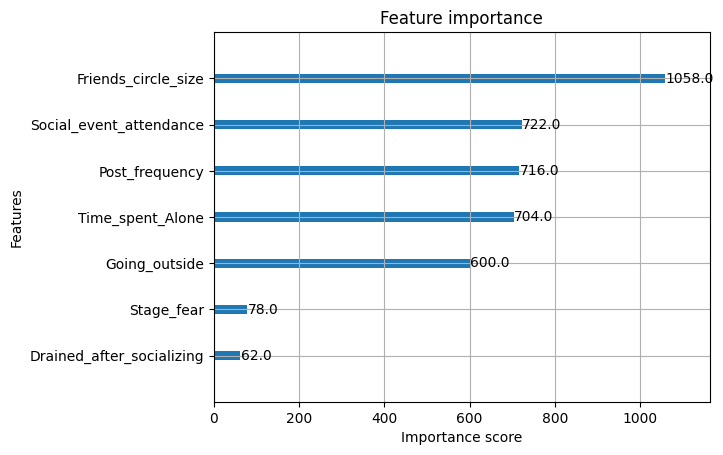

In [44]:
from xgboost import plot_importance

feature_model=XGBClassifier(eval_metric='logloss')
feature_model.fit(X_train,y_train)

#PLot top Features
plot_importance(feature_model,max_num_features=10)
plt.show()

In [45]:
X_train_drop=X_train.drop(['Stage_fear','Drained_after_socializing'],axis=1)
X_test_drop=X_test.drop(['Stage_fear','Drained_after_socializing'],axis=1)
feature_model.fit(X_train_drop,y_train)
y_pred_feature=feature_model.predict(X_test_drop)
feature_result=classification_report(y_pred_feature,y_test)
print(feature_result)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2771
           1       0.93      0.95      0.94       934

    accuracy                           0.97      3705
   macro avg       0.95      0.96      0.96      3705
weighted avg       0.97      0.97      0.97      3705



In [46]:
test_data_drop=test_data.drop(['Stage_fear','Drained_after_socializing'],axis=1)
y_test_feature=feature_model.predict(test_data_drop)
submission=pd.read_csv("/kaggle/input/playground-series-s5e7/sample_submission.csv")
submission['Personality']=y_test_feature
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("Submission_Feature_importance.csv",index=False)

## 6.4 Cross-Validation

In [47]:
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedKFold

cv_model=XGBClassifier(eval_metric='logloss',
                      verbosity=0)
skf=StratifiedKFold(n_splits=5,
                   shuffle=True,
                   random_state=42)

In [48]:
f1_scores=[]
for fold,(train_idx,val_idx) in enumerate(skf.split(X,y)):
    print(f"Fold:{fold+1}")
    
    X_train,X_val=X.iloc[train_idx],X.iloc[val_idx]
    y_train,y_val=y.iloc[train_idx],y.iloc[val_idx]
    
    cv_model.fit(X_train,y_train)
    y_pred=cv_model.predict(X_val)
    
    score=f1_score(y_val,y_pred,average='weighted')
    print(f"F1:{score:.4f}")
    
    f1_scores.append(score)
    print(classification_report(y_val,y_pred))
print(f"Average F1 Score across folds:{np.mean(f1_scores):.4f}")

Fold:1
F1:0.9668
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2740
           1       0.93      0.94      0.94       965

    accuracy                           0.97      3705
   macro avg       0.96      0.96      0.96      3705
weighted avg       0.97      0.97      0.97      3705

Fold:2
F1:0.9637
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2740
           1       0.94      0.92      0.93       965

    accuracy                           0.96      3705
   macro avg       0.96      0.95      0.95      3705
weighted avg       0.96      0.96      0.96      3705

Fold:3
F1:0.9632
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2740
           1       0.94      0.92      0.93       965

    accuracy                           0.96      3705
   macro avg       0.95      0.95      0.95      3705
weighted avg       0.96

In [49]:
y_test_cv=cv_model.predict(test_data)
submission=pd.read_csv("/kaggle/input/playground-series-s5e7/sample_submission.csv")
submission['Personality']=y_test_cv
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("Submission_Cross_Validation.csv",index=False)

## 6.5 Ensemble Learning

In [50]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

base_models=[
        ('xgb',XGBClassifier(eval_metric='logloss',verbosity=0)),
        ('lgbm',LGBMClassifier())
]

meta_model=LogisticRegression()

stacking_clf=StackingClassifier(estimators=base_models,
                               final_estimator=meta_model,
                               cv=3,
                               stack_method='predict_proba')

stacking_clf.fit(X_train,y_train)
y_pred=stacking_clf.predict(X_test)
stacking_result=classification_report(y_pred,y_test)
print(stacking_result)

[LightGBM] [Info] Number of positive: 3860, number of negative: 10960
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 62
[LightGBM] [Info] Number of data points in the train set: 14820, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.260459 -> initscore=-1.043585
[LightGBM] [Info] Start training from score -1.043585
[LightGBM] [Info] Number of positive: 2574, number of negative: 7306
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 62
[LightGBM] [Info] Number of data points in the train set: 9880, number of used features: 7
[LightGBM] [Info] [binary:Bo

In [51]:
y_test_stack=stacking_clf.predict(test_data)
submission=pd.read_csv("/kaggle/input/playground-series-s5e7/sample_submission.csv")
submission['Personality']=y_test_stack
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("Submission_Ensemble_Method.csv",index=False)

## 6.6. Use SHAP

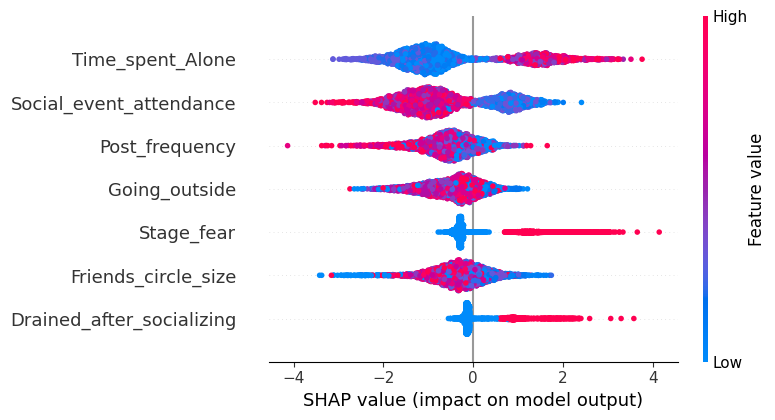

In [52]:
import shap

explainer=shap.TreeExplainer(xg_model)
shap_values=explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

## 7. Final Model
XGBOOST + SMOTE + GridSearchCV + StackingClassifier + Feature Engineering/SHAP

In [53]:
X_train_smote_final=X_train_smote.drop(['Stage_fear','Drained_after_socializing'],axis=1)
X_test_final=X_test.drop(['Stage_fear','Drained_after_socializing'],axis=1)
test_data_final=test_data.drop(['Stage_fear','Drained_after_socializing'],axis=1)
X_train_smote_final

,Time_spent_Alone,Social_event_attendance,Going_outside,Friends_circle_size,Post_frequency
0,1.000000,7.000000,4.000000,10.000000,5.000000
1,2.000000,4.000000,6.000000,6.000000,8.000000
2,4.000000,5.000000,5.000000,7.000000,6.000000
3,3.000000,6.000000,0.000000,8.000000,8.000000
4,2.000000,7.000000,7.000000,15.000000,4.000000
...,...,...,...,...,...
21887,11.000000,0.000000,0.670726,2.000000,2.000000
21888,10.859677,1.000000,0.000000,5.000000,0.000000
21889,0.000000,6.000000,5.000000,13.628808,7.371192
21890,7.000000,3.000000,1.000000,0.294980,2.000000


In [54]:
## Base Models
xgb=XGBClassifier(eval_metric='logloss',
                  verbosity=0,
                  random_state=42,
                  colsample_bytree=0.8,
                  gamma=1,
                  learning_rate=0.1,
                  max_depth=3,
                  min_child_weight=1,
                  n_estimators=500,
                 subsample=0.6 
                 )
lgbm=LGBMClassifier(random_state=42)
meta_model=LogisticRegression(max_iter=1000,solver='liblinear')

stacking_clf_final=StackingClassifier(
    estimators=[('xgb',xgb),('lgbm',lgbm)],
    final_estimator=meta_model,
    stack_method='predict_proba',
    cv=3
)

param_grid={
    'lgbm__n_estimators':[100,200,300,400,500],
    'lgbm__learning_rate':[0.1,0.01,0.001,0.0001],
    'lgbm__max_depth':[3,5,7,9]
}

grid=GridSearchCV(estimator=stacking_clf_final,
                 param_grid=param_grid,
                 scoring='f1_weighted',
                 cv=3,
                 verbose=0,
                 n_jobs=-1)
grid.fit(X_train_smote_final,y_train_smote)

[LightGBM] [Info] Number of positive: 7297, number of negative: 7297
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 14594, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

GridSearchCV(cv=3,
             estimator=StackingClassifier(cv=3,
                                          estimators=[('xgb',
                                                       XGBClassifier(base_score=None,
                                                                     booster=None,
                                                                     callbacks=None,
                                                                     colsample_bylevel=None,
                                                                     colsample_bynode=None,
                                                                     colsample_bytree=0.8,
                                                                     device=None,
                                                                     early_stopping_rounds=None,
                                                                     enable_categorical=False,
                                                                     eval_metric='logloss',
                                                                     feature_types=None,
                                                                     feature_weights=None,
                                                                     gamma=1,
                                                                     grow_policy=None,
                                                                     impo...
                                                                     n_estimators=500,
                                                                     n_jobs=None,
                                                                     num_parallel_tree=None, ...)),
                                                      ('lgbm',
                                                       LGBMClassifier(random_state=42))],
                                          final_estimator=LogisticRegression(max_iter=1000,
                                                                             solver='liblinear'),
                                          stack_method='predict_proba'),
             n_jobs=-1,
             param_grid={'lgbm__learning_rate': [0.1, 0.01, 0.001, 0.0001],
                         'lgbm__max_depth': [3, 5, 7, 9],
                         'lgbm__n_estimators': [100, 200, 300, 400, 500]},
             scoring='f1_weighted')

In [55]:
final_model=grid.best_estimator_
y_pred_final=final_model.predict(X_test_final)
final_result=classification_report(y_pred_final,y_test)
print(final_result)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2766
           1       0.93      0.94      0.94       939

    accuracy                           0.97      3705
   macro avg       0.96      0.96      0.96      3705
weighted avg       0.97      0.97      0.97      3705



In [56]:
y_test_final=final_model.predict(test_data_final)
submission['Personality']=y_test_final
submission['Personality']=submission['Personality'].replace(1,'Introvert')
submission['Personality']=submission['Personality'].replace(0,'Extrovert')
submission.to_csv("final_submission.csv",index=False)